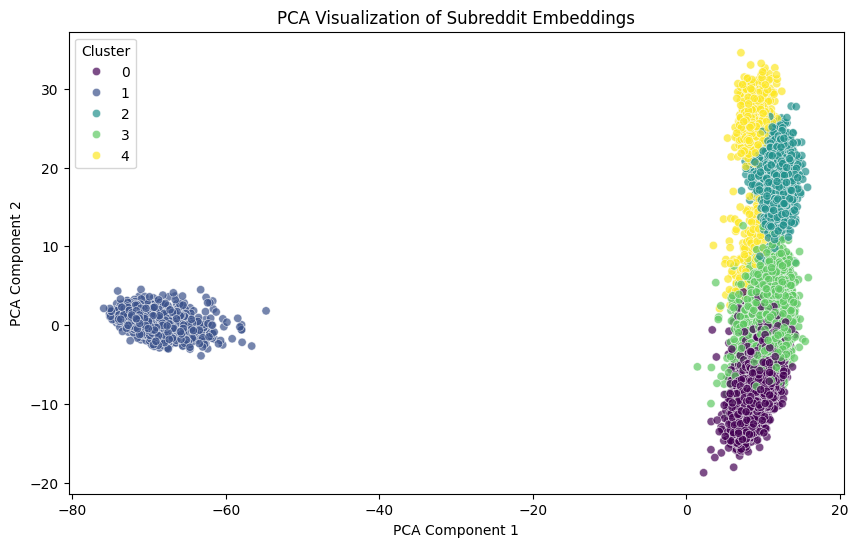

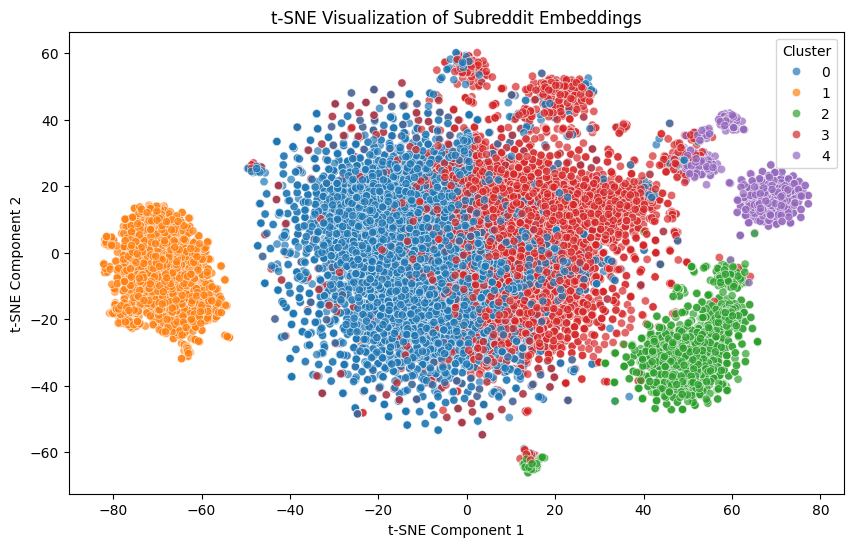

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import seaborn as sns

# Load embeddings from one of the generated CSVs
df_path = r"C:\Users\tommy\Developer\trend-finder\src\data\df_processed_all_v2.csv"  # Assuming embeddings are stored here
df = pd.read_csv(df_path)

# Extract embedding column
embedding_col = "llama3.2_3B_embs"  # Adjust based on stored column name
if embedding_col not in df.columns:
    raise ValueError(f"Column {embedding_col} not found in dataset.")

# Convert embeddings from string to numpy array
df[embedding_col] = df[embedding_col].apply(lambda x: np.array(eval(x)) if isinstance(x, str) else x)

# Stack embeddings into a numpy matrix
embeddings = np.vstack(df[embedding_col].values)

# Reduce dimensions with PCA
pca = PCA(n_components=2)
pca_embeddings = pca.fit_transform(embeddings)

# Apply t-SNE for better visualization
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_embeddings = tsne.fit_transform(embeddings)

# Perform KMeans clustering
num_clusters = 5  # Arbitrary, can be tuned
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
df["cluster"] = kmeans.fit_predict(embeddings)

# Plot PCA visualization
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_embeddings[:, 0], y=pca_embeddings[:, 1], hue=df["cluster"], palette="viridis", alpha=0.7)
plt.title("PCA Visualization of Subreddit Embeddings")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()

# Plot t-SNE visualization
plt.figure(figsize=(10, 6))
sns.scatterplot(x=tsne_embeddings[:, 0], y=tsne_embeddings[:, 1], hue=df["cluster"], palette="tab10", alpha=0.7)
plt.title("t-SNE Visualization of Subreddit Embeddings")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Cluster")
plt.show()


In [2]:
import plotly.express as px

# Ensure the embeddings dataset is available
if 'prompt' not in df.columns:
    raise ValueError("Column 'prompt' not found in dataset.")

# Create interactive PCA scatter plot
fig_pca = px.scatter(
    x=pca_embeddings[:, 0], 
    y=pca_embeddings[:, 1], 
    color=df["cluster"].astype(str), 
    hover_data={"Prompt": df["prompt"]},
    title="PCA Visualization of Subreddit Embeddings",
    labels={"x": "PCA Component 1", "y": "PCA Component 2", "color": "Cluster"}
)

# Show PCA plot
fig_pca.show()

# Create interactive t-SNE scatter plot
fig_tsne = px.scatter(
    x=tsne_embeddings[:, 0], 
    y=tsne_embeddings[:, 1], 
    color=df["cluster"].astype(str), 
    hover_data={"Prompt": df["prompt"]},
    title="t-SNE Visualization of Subreddit Embeddings",
    labels={"x": "t-SNE Component 1", "y": "t-SNE Component 2", "color": "Cluster"}
)

# Show t-SNE plot
fig_tsne.show()